In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import diffxpy.api as de

In [2]:
import scvelo as scv

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.9.1 pandas==1.4.3 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [4]:
scv.set_figure_params(style='scvelo',dpi=300)

In [5]:
results_file = 'kdm6b.h5ad'

In [5]:
adata1=sc.read_loom('./kdm6b/kdm6bwt.loom')
adata2=sc.read_loom('./kdm6b/kdm6bko.loom')

In [6]:
adata1.var_names_make_unique()
adata2.var_names_make_unique()

In [7]:
adata=adata1.concatenate(adata2, batch_key="condition",batch_categories=['wt','ko'])

In [8]:
adata

AnnData object with n_obs × n_vars = 23837 × 55487
    obs: 'Clusters', '_X', '_Y', 'condition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

normalizing counts per cell
    finished (0:00:00)


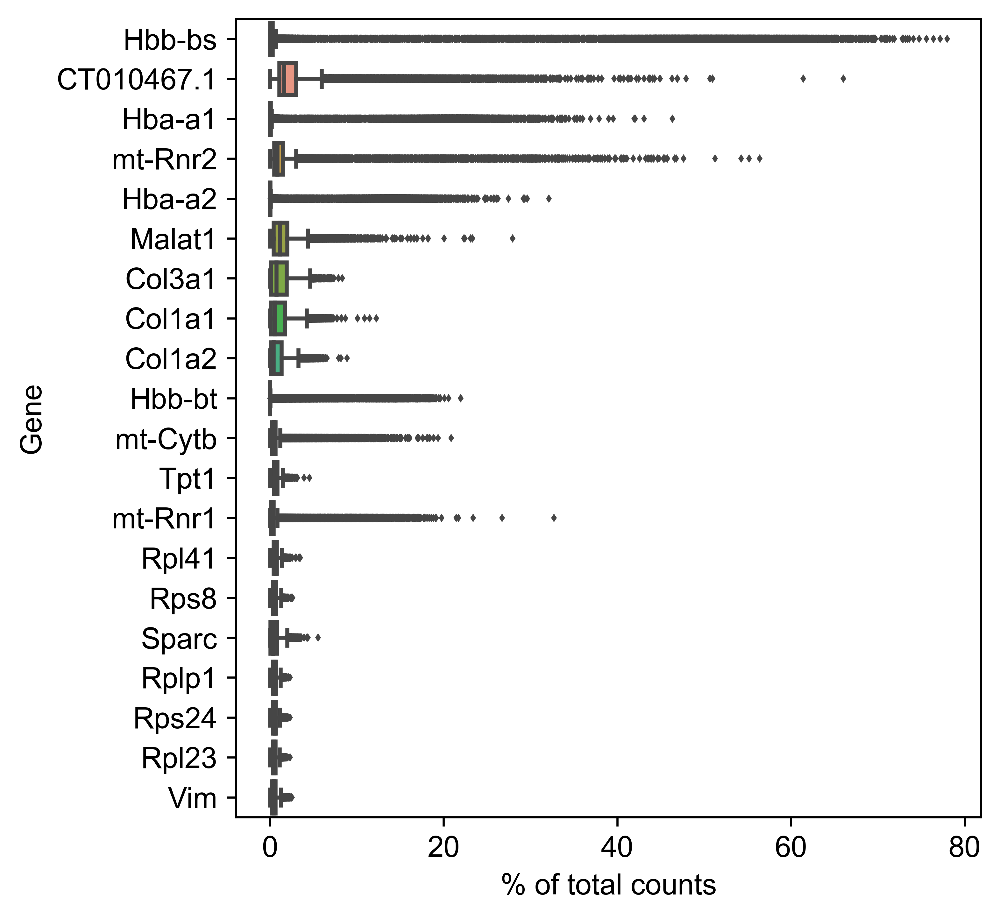

In [9]:
sc.pl.highest_expr_genes(adata, n_top=20 )

In [10]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=1)

filtered out 2366 cells that have less than 200 genes expressed
filtered out 22861 genes that are detected in less than 1 cells


In [11]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

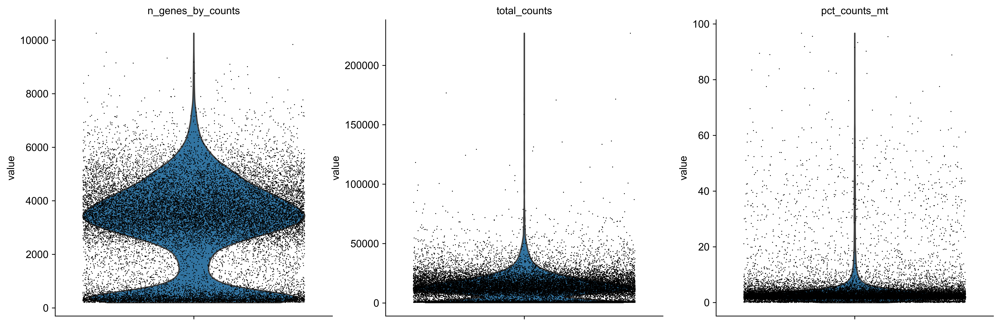

In [12]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

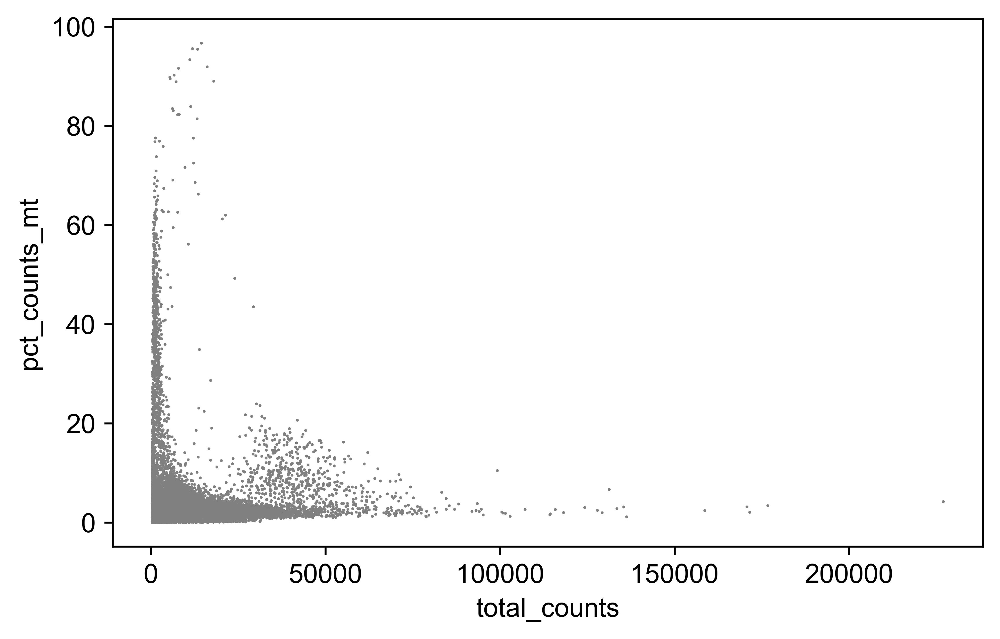

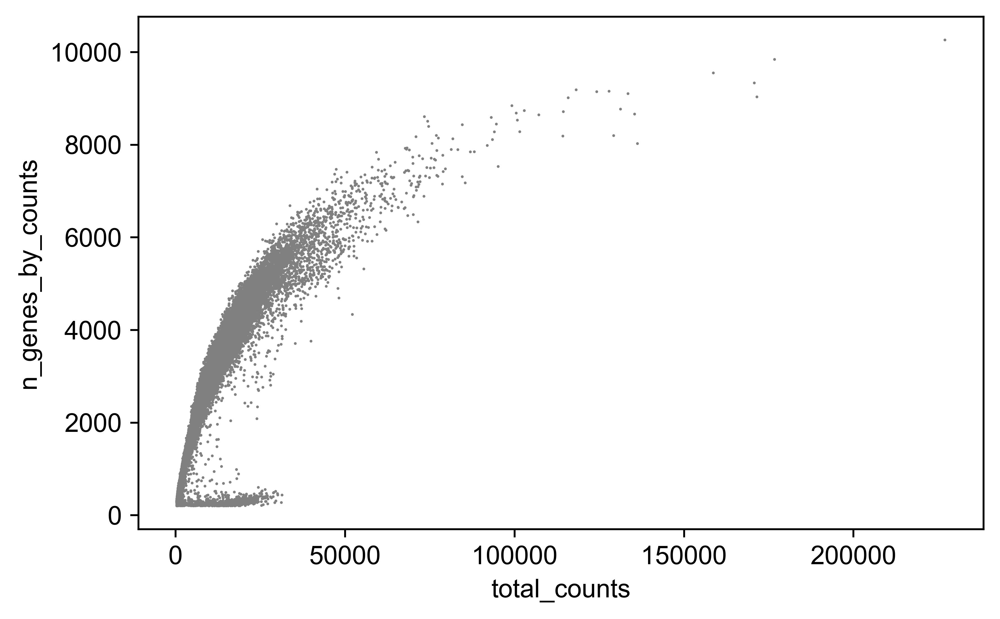

In [13]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [14]:
adata = adata[adata.obs.n_genes_by_counts < 5000, :]
adata = adata[adata.obs.pct_counts_mt < 10, :]

In [15]:
adata

View of AnnData object with n_obs × n_vars = 18283 × 32626
    obs: 'Clusters', '_X', '_Y', 'condition', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [16]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [17]:
sc.pp.log1p(adata)

In [18]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


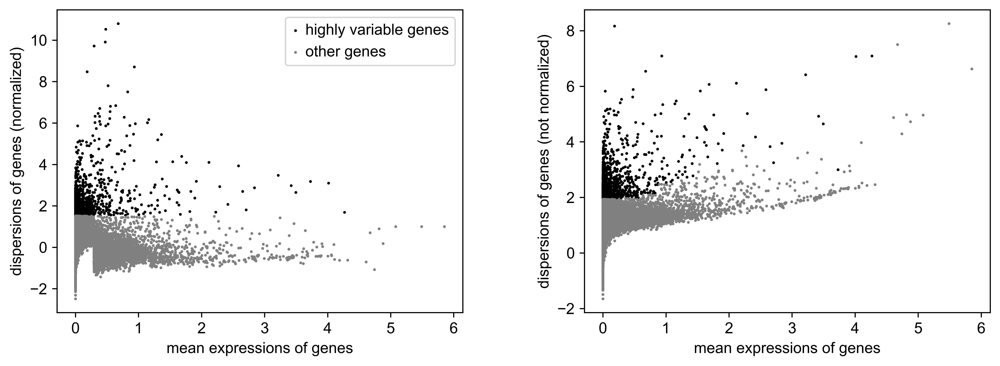

In [19]:
sc.pl.highly_variable_genes(adata)

In [20]:
adata.raw=adata

In [21]:
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [22]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


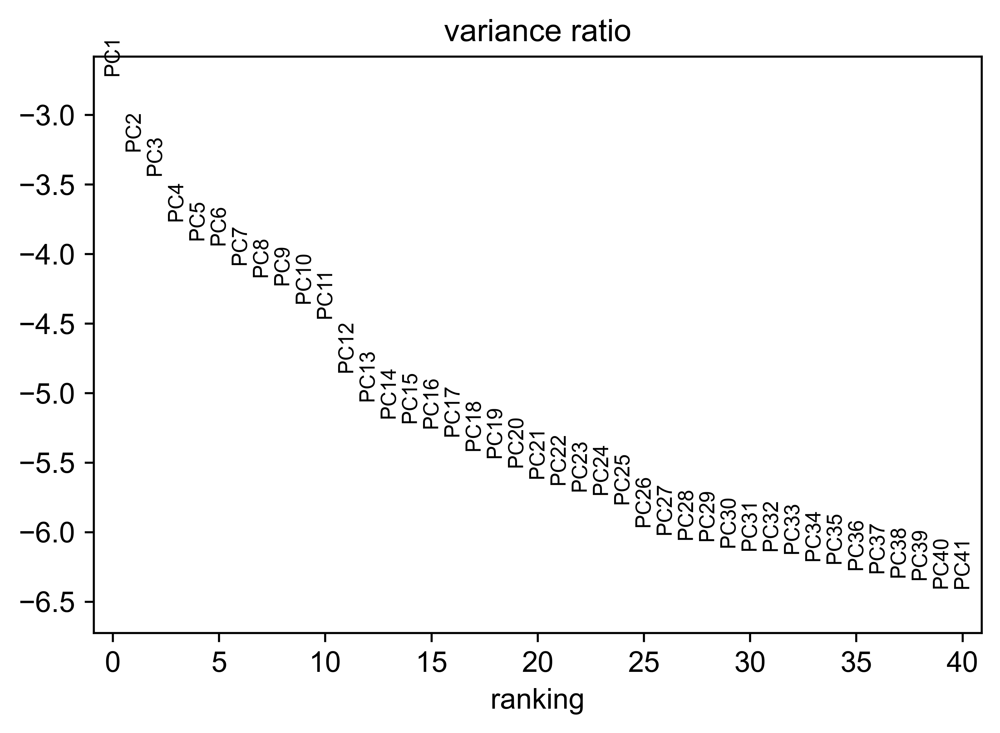

In [23]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=40)

In [24]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)


In [25]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


In [26]:
sc.tl.leiden(adata,resolution=0.4)

running Leiden clustering
    finished: found 26 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


In [34]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:28)


In [328]:
df=pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(30)

In [332]:
df['2'].head(20)

0     CT010467.1
1        Mir6236
2         Hbb-bs
3         Hba-a1
4         Hba-a2
5         Hbb-bt
6          Fabp4
7           Car3
8            Cfd
9         Col1a1
10          Retn
11        Adipoq
12        Col1a2
13         Thrsp
14           H19
15         Cox8b
16         Plin1
17       mt-Rnr1
18          Adig
19         Acta1
Name: 2, dtype: object

In [28]:
adata.uns['condition_colors']=['#4F4D4D','#7A0202']

In [32]:
clusterid ={
    '0' : 'Fibroblasts' ,
    '1' : 'Fibroblasts',
    '2' : 'Fibroblasts',
    '3' : 'Fibroblasts',
    '4' : 'Fibroblasts',
    '5' : 'Fibroblasts',
    '6' : 'Fibroblasts' ,
    '7' : 'Pericytes',
    '8' : 'Mast Cells',
    '9' : 'Erythrocytes',
    '10' : 'Blood Vessels',
    '11' : 'Fibroblasts',
    '12' : 'Macrophages',
    '13' : 'Keratinocytes',
    '14' : 'Macrophages',
    '15' : 'Nerve Cells',
    '16' : 'Muscle Cells',
    '17' : 'Lymphatic Vessels',
    '18' : 'Muscle Cells',
    '19' : 'B Cells',
    '20' : 'Fibroblasts',
    '21' : 'Fibroblasts',
    '22' : 'Fibroblasts',
    '23' : 'Melanocytes',
    '24' : 'Myeloid Cells',
    '25' : 'Myeloid Cells'
}
adata.obs['Cell Type'] = adata.obs['leiden'].map(clusterid).astype('category')

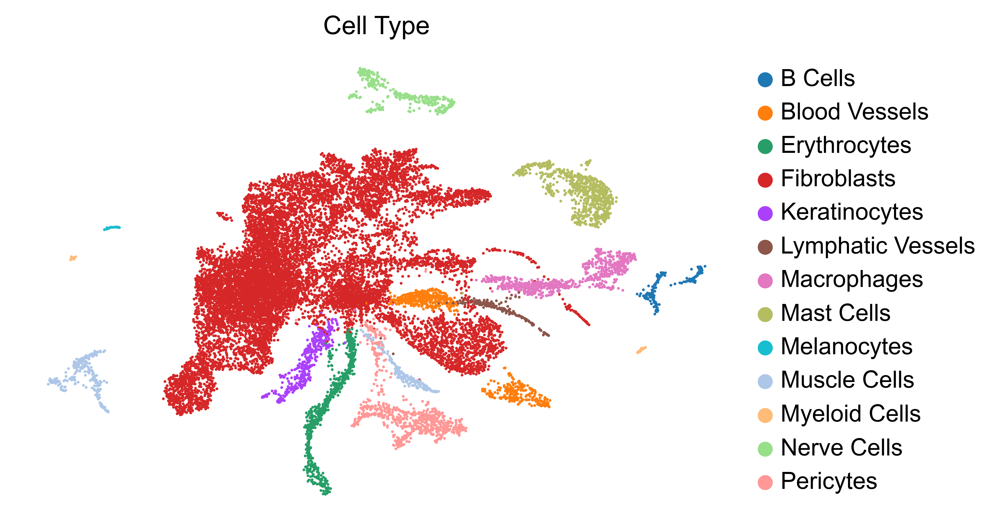

In [33]:
sc.pl.umap(adata,color=['Cell Type'],frameon=False)

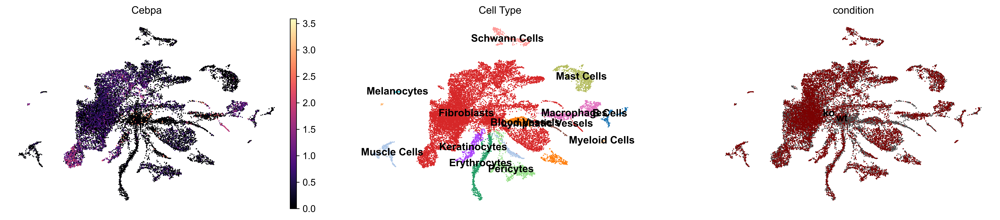

In [32]:
sc.pl.umap(adata,color=['Cebpa','Cell Type','condition'],frameon=False,legend_loc='on data',cmap='magma')

In [34]:
cellcount=pd.crosstab(adata.obs['Cell Type'],adata.obs['condition'])

In [101]:
cellcount.to_csv("./kdm6b/celltype count.csv")

In [188]:
cellcount=pd.crosstab(adata.obs['Cell Type'],adata.obs['condition'],normalize='index')

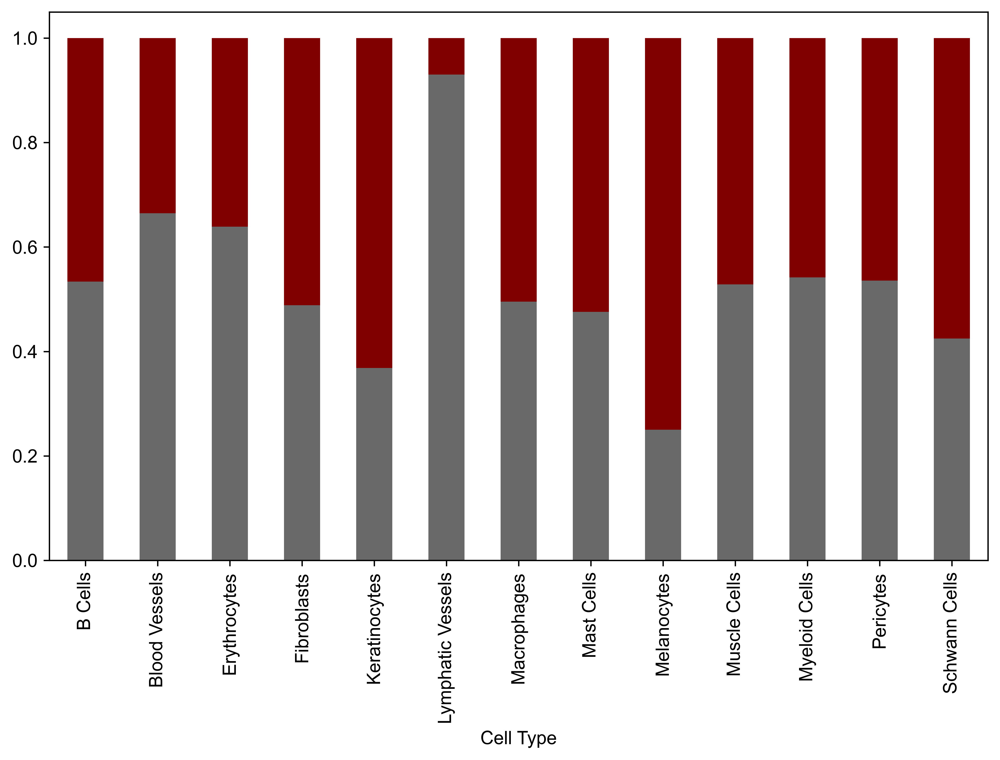

In [189]:
cellcount.plot(kind='bar',stacked=True, figsize=(10,6),legend= None,color=['dimgrey','maroon'])
plt.grid(visible=False)
plt.show()